# Imports

In [1]:
import pandas as pd
import numpy as np
from time import time

#plot
import seaborn as sns
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import plotly.express as px

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, confusion_matrix
from sklearn.model_selection import StratifiedKFold, cross_val_score

from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import BernoulliNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier

from sklearn.feature_selection import SelectFromModel
from sklearn.decomposition import TruncatedSVD
from sklearn.utils import shuffle

sns.set(style="ticks", context="talk")
#plt.style.use("dark_background")

# Paths

In [2]:
drive_path = "data/"
file = "data/sentiment140_standard_v.csv"

# Read file

In [3]:
df = pd.read_csv(file)
print(df.shape)
df.head()

(1600000, 2)


,target,text
0,0,user url aww bummer shoulda get david carr thi...
1,0,upset update facebook texting might cry result...
2,0,user dive many time ball manage save 50 rest g...
3,0,whole body feel itchy like fire
4,0,user behave mad see


# Drop NA's

In [4]:
df = df.dropna()
print(df.shape)
df = df.reset_index()[["target", "text"]]
df.tail()

(1599528, 2)


,target,text
1599523,1,wake school best feel ever
1599524,1,thewdb com cool hear old walt interview url
1599525,1,ready mojo makeover ask detail
1599526,1,happy 38th birthday boo time tupac amaru shakur
1599527,1,happy charitytuesday user user user


# Histogram of classes

Count negative: 799739
Count positive: 799789


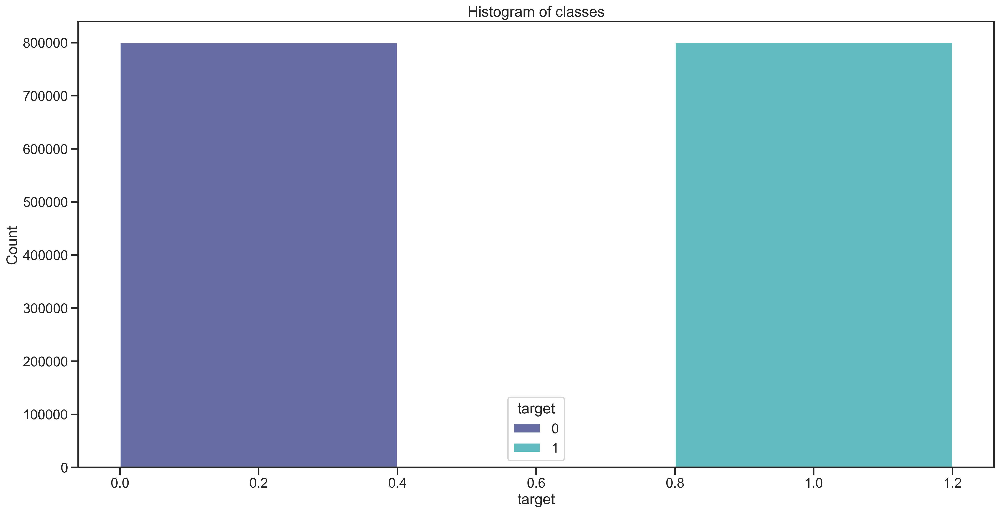

In [75]:
print("Count negative:", df[df["target"] == 0]["target"].count())
print("Count positive:", df[df["target"] == 1]["target"].count())
sns.histplot(data=df, x="target", binwidth=0.4, hue="target", palette="mako", alpha=0.8)
plt.title("Histogram of classes")

plt.rcParams['figure.figsize'] = (20, 10)
plt.rcParams['figure.dpi'] = 300

# Wordclouds

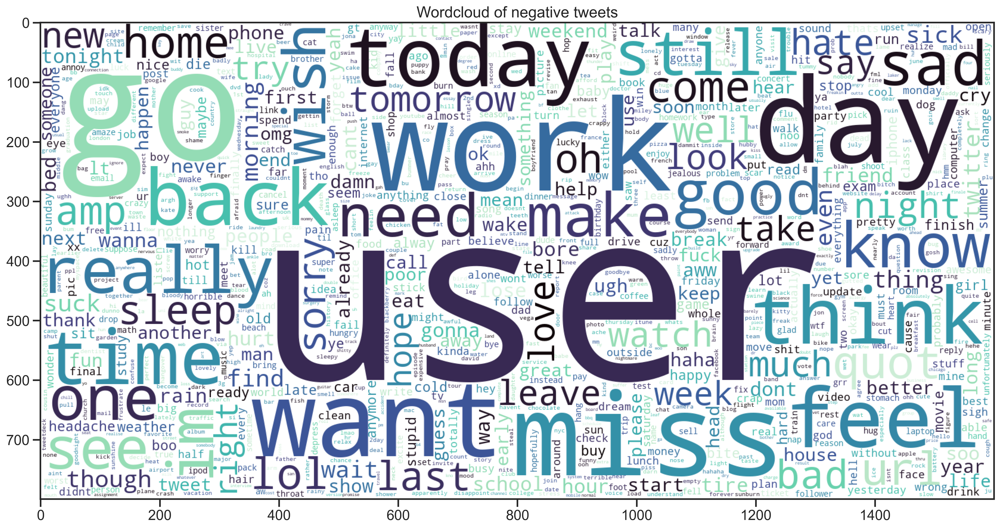

In [80]:
data_neg = list(df[df["target"] == 0]["text"])
plt.figure(figsize = (20,20))
wc = WordCloud(colormap='mako', max_words = 1000 , width = 1600 , height = 800, collocations=False, background_color="white").generate(" ".join(data_neg))
plt.title('Wordcloud of negative tweets')
plt.imshow(wc)

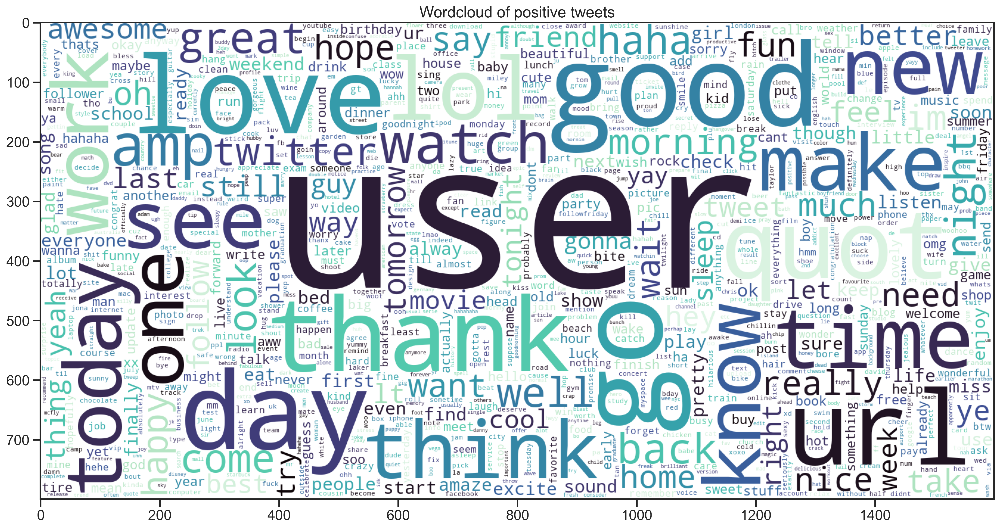

In [81]:
data_pos = list(df[df["target"] == 1]["text"])
plt.figure(figsize = (20,20))
wc = WordCloud(colormap='mako', max_words = 1000 , width = 1600 , height = 800, collocations=False, background_color="white").generate(" ".join(data_pos))
plt.title('Wordcloud of positive tweets')
plt.imshow(wc)

# Prepare data

In [5]:
df2 = shuffle(df)
x = df2["text"]
y = df2["target"]

# Data scatterplot

In [26]:
vectoriser = TfidfVectorizer(ngram_range=(1,2), max_features=int(1e6))
vectoriser.fit(x)
x_new = vectoriser.transform(x)
tsvd = TruncatedSVD(n_components=3)
tsvd.fit(x_new)

TruncatedSVD(n_components=3)

In [ ]:
plot_data = tsvd.transform(x_new)
data = {'c1': plot_data[:500000,0], 'c2': plot_data[:500000,1], 'c3': plot_data[:500000,2], 'y': y[:500000]}
df = pd.DataFrame(data)
fig = px.scatter_3d(df, x='c1', y='c2', z='c3', color='y', template='seaborn', 
                    title='Data plot with TruncatedSVD', color_continuous_scale='dense', 
                    range_color=(-0.5,1.75))
fig.show()

Text(0.5, 1.0, 'Data plot with TruncatedSVD')

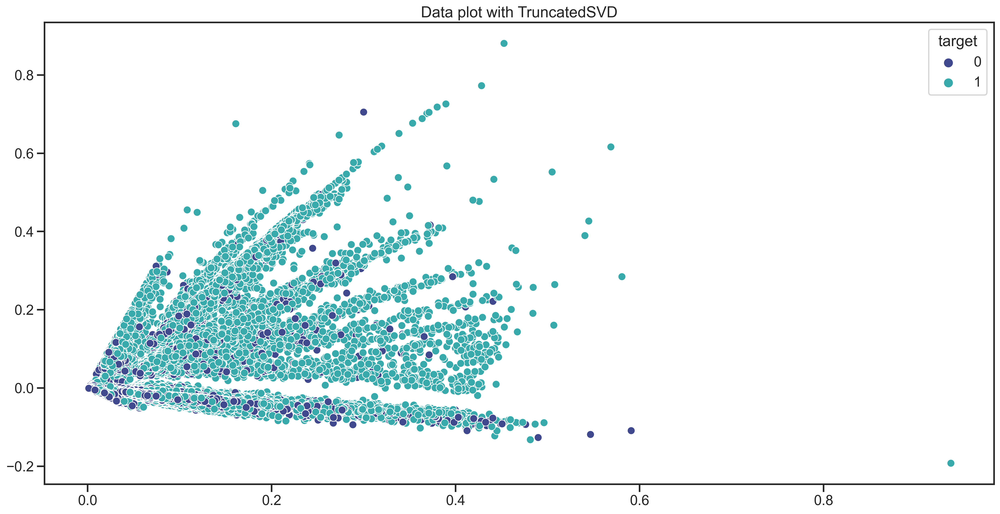

In [95]:
plot_data = tsvd.transform(x_new)
plot_x = plot_data[:,0]
plot_y = plot_data[:,1]
sns.scatterplot(x=plot_x, y=plot_y, hue=y, palette='mako')
plt.title('Data plot with TruncatedSVD')

In [8]:
def evaluate_models(models, model_names, x, y):
    x = np.array(x)
    y = np.array(y)
    data = {"model":[], "accuracy":[], "confusion matrix": [], 'training_time': [], "test_time": []}
    cv = StratifiedKFold(n_splits=5)
        
    for train_index, test_index in cv.split(x, y):
        x_train = x[train_index]
        y_train = y[train_index]
        x_test = x[test_index]
        y_test = y[test_index]
        print('Start Vectorizer')
        vectoriser = TfidfVectorizer(ngram_range=(1,2), max_features=int(1e6))
        vectoriser.fit(x_train)
        x_train = vectoriser.transform(x_train)
        x_test = vectoriser.transform(x_test)
        mi = 0
        print('Start Feature Selection')
        svm = LinearSVC(C=1, penalty="l1", dual=False, max_iter=500).fit(x_train, y_train)
        feature_selection = SelectFromModel(svm, prefit=True, max_features=int(1e6))
        x_train = feature_selection.transform(x_train)
        x_test = feature_selection.transform(x_test)
        
        for model in models:
            print(model_names[mi], "started")
            start_time = time()
            model.fit(x_train, y_train)
            elapsed_time = time() - start_time
            data["training_time"].append(elapsed_time)
            start_time = time()
            y_pred = model.predict(x_test)
            elapsed_time = time() - start_time
            data["test_time"].append(elapsed_time)
            print("Run finished")
            data["model"].append(model_names[mi])
            data["accuracy"].append(accuracy_score(y_test, y_pred))
            data["confusion matrix"].append(confusion_matrix(y_test, y_pred))
            
            df_res = pd.DataFrame(data)
            df_res.to_csv(drive_path + "sentiment140_results.csv")
            mi += 1

    return data

In [ ]:
SVM = LinearSVC(tol=1e-2, max_iter=100)
RandomForest = RandomForestClassifier(n_estimators=100, max_samples=0.5, n_jobs=-1, max_depth=20)
NaiveBayes = BernoulliNB()
KNN = KNeighborsClassifier(n_jobs=-1)
LogReg = LogisticRegression(n_jobs=-1, solver="sag")
nn = MLPClassifier(max_iter=100, hidden_layer_sizes=(128, 256, 512, 256, 128), tol=1e-2, 
                   early_stopping=True)
models = [SVM, RandomForest, NaiveBayes, KNN, LogReg, nn]
model_names = ["SVM", "Random Forest", "Naive Bayes", "KNN", "Logistic Regression", "Neural Network"]
results = evaluate_models(models, model_names, x, y)

# Read results

In [99]:
df_results = pd.read_csv('data/sentiment140_results.csv')
df_results.head()

,model,accuracy,confusion matrix,training_time,test_time
0,SVM,0.779226,[[122523 37425]\n [ 33202 126756]],7.891782,0.008507
1,Naive Bayes,0.776575,[[121740 38208]\n [ 33267 126691]],0.232699,0.042038
2,Logistic Regression,0.790657,[[123926 36022]\n [ 30948 129010]],13.651656,0.009006
3,SVM,0.780264,[[122564 37384]\n [ 32911 127047]],7.762674,0.008005
4,Naive Bayes,0.776381,[[121652 38296]\n [ 33241 126717]],0.233702,0.039034


In [183]:
data = {'model': [], 'accuracy': [], 'std': [], 'confusion matrix': [], 'training_time': [], 
        'test_time': []}

for model in df_results['model'].unique():
    filter_data = df_results[df_results['model'] == model]
    data['model'].append(model)
    data['accuracy'].append(filter_data['accuracy'].mean())
    data['std'].append(filter_data['accuracy'].std())
    matrix = np.zeros((2,2))
    for i in range(len(filter_data)):
        matrix += np.matrix(filter_data['confusion matrix'].iloc[i]).reshape(2,2)
    matrix /= len(filter_data)
    data['confusion matrix'].append(matrix)
    data['training_time'].append(filter_data['training_time'].mean())
    data['test_time'].append(filter_data['test_time'].mean())
    
df_res = pd.DataFrame(data)
df_res.head()

,model,accuracy,std,confusion matrix,training_time,test_time
0,SVM,0.779938,0.000676,"[[122471.2, 37476.6], [32922.4, 127035.4]]",7.867361,0.008707
1,Naive Bayes,0.777024,0.000592,"[[121598.2, 38349.6], [32981.8, 126976.0]]",0.229997,0.038434
2,Logistic Regression,0.791042,0.000530,"[[123898.4, 36049.4], [30797.4, 129160.4]]",13.807748,0.009208


Text(0.5, 242.25000000000003, 'Predicted')

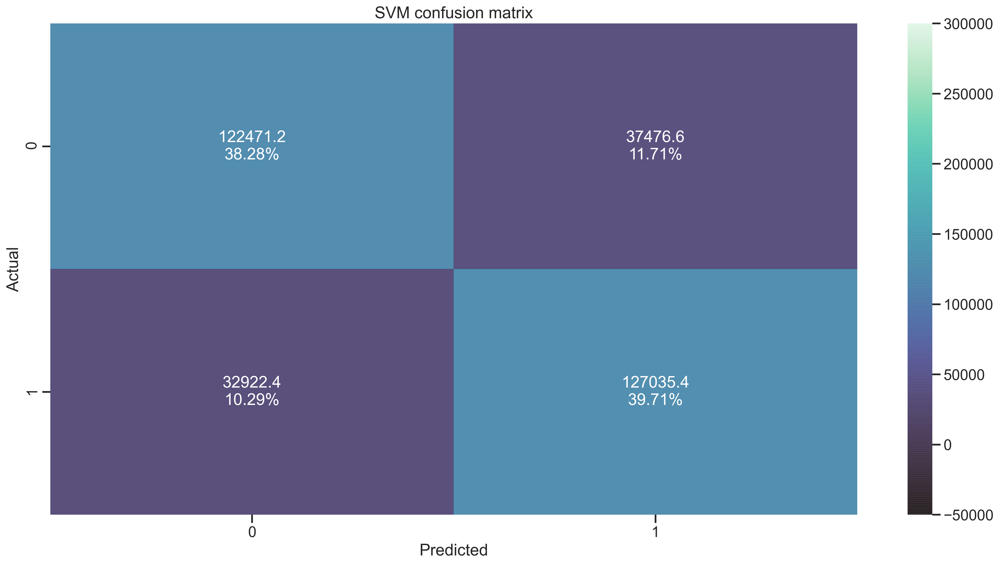

In [184]:
smax = data['confusion matrix'][0].sum()
labels = []
for r in data['confusion matrix'][0]:
    l = []
    for c in r:
        l.append(str(c) + '\n' + str(np.round(c/smax*100, 2)) + '%')
    labels.append(l)
    

sns.heatmap(data['confusion matrix'][0], annot=labels, fmt='s', cmap='mako', 
            vmax=300000, vmin=-50000, alpha=0.85)
plt.title('SVM confusion matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')

Text(0.5, 242.25000000000003, 'Predicted')

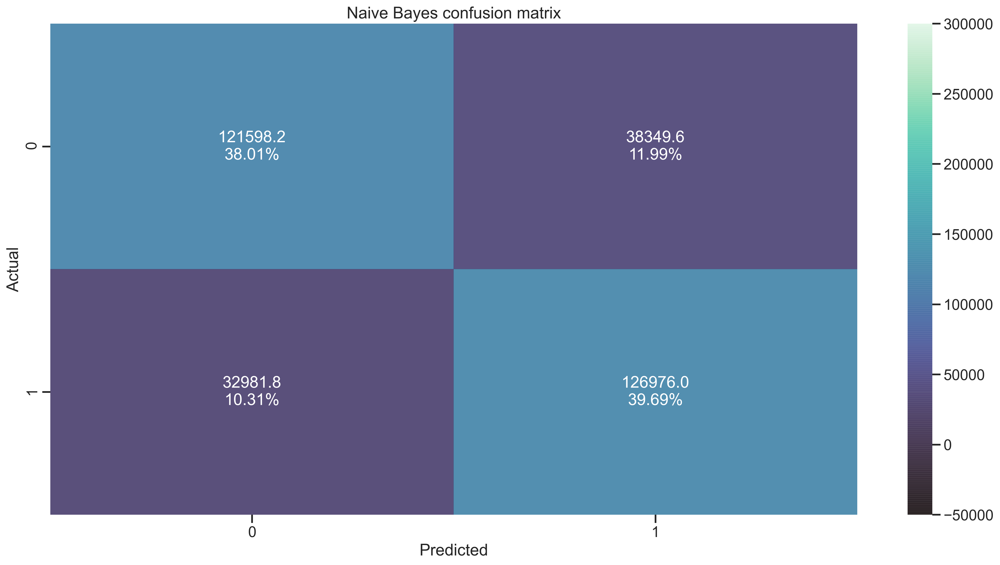

In [185]:
smax = data['confusion matrix'][1].sum()
labels = []
for r in data['confusion matrix'][1]:
    l = []
    for c in r:
        l.append(str(c) + '\n' + str(np.round(c/smax*100, 2)) + '%')
    labels.append(l)
    

sns.heatmap(data['confusion matrix'][1], annot=labels, fmt='s', cmap='mako', 
            vmax=300000, vmin=-50000, alpha=0.85)
plt.title('Naive Bayes confusion matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')

Text(0.5, 242.25000000000003, 'Predicted')

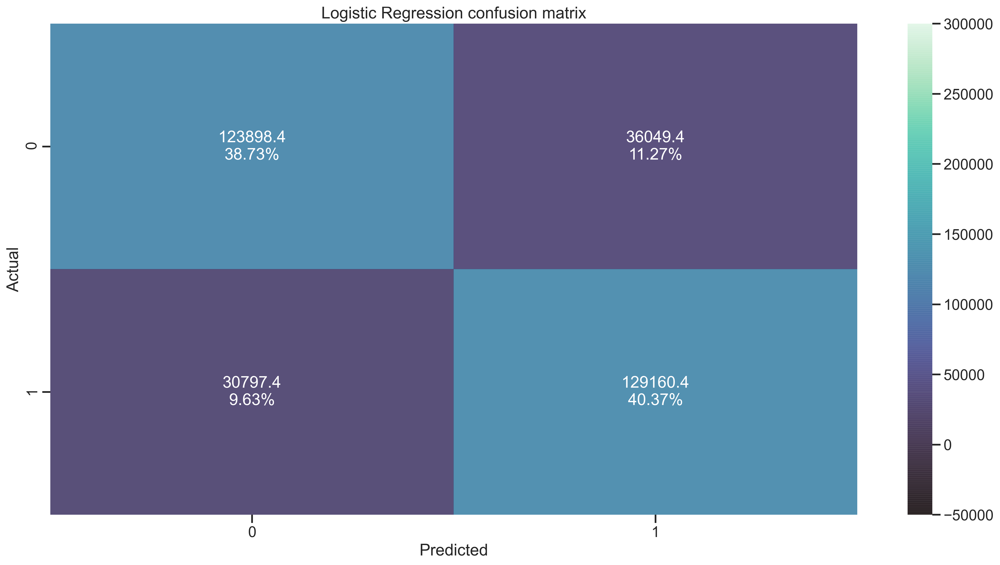

In [186]:
smax = data['confusion matrix'][2].sum()
labels = []
for r in data['confusion matrix'][2]:
    l = []
    for c in r:
        l.append(str(c) + '\n' + str(np.round(c/smax*100, 2)) + '%')
    labels.append(l)
    

sns.heatmap(data['confusion matrix'][2], annot=labels, fmt='s', cmap='mako', 
            vmax=300000, vmin=-50000, alpha=0.85)
plt.title('Logistic Regression confusion matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')